<left><h1 style="color: black;"> (Natural Language Processing) –Diving into Restaurant Reviews:
What are users saying about Restaurants in OHIO
<h1></left>


<div style="background-color:#3b528b;  color:white; padding:20px">
<h2> 1. Business Objectives </h2>
</div>

- Understanding Customer Preferences and Perceptions: By analyzing restaurant reviews, the project aims to gain insights into what customers enjoy or dislike in various restaurants..
- Identifying trends in 5-star and 1-star reviews helps in understanding the strengths and weaknesses of various restaurants. This information is crucial for improving service quality and developing effective strategies

<div style="background-color:#3b528b;  color:white; padding:20px">
<h2> 2. Technical Objectives </h2>
</div>

* Data Collection and Management: Efficiently importing and managing data from an external source (csv files) into a structured format suitable for analysis.
* Natural Language Processing (NLP): Applying NLP techniques to analyze textual data from restaurant reviews. This includes tasks like tokenization, stop-word removal, and lemmatization.
* Data Analysis and Visualization: Utilizing data analysis techniques to extract meaningful patterns and trends from the reviews. Creating visualizations like word clouds and n-gram analyses to represent these findings.
* Demonstrates how to compare false reviews by stemming and lemmatizing.  	 


<div style="background-color:#3b528b;  color:white; padding:20px">
<h2> 3. Import Libraries </h2>
</div>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# NOTE: you will need more libraries but you may import them when they are needed.
# Helpful options to add to your import code block:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)
pd.options.mode.chained_assignment = None
plt.style.use('seaborn-colorblind') 

/var/folders/7w/g9brbv890v97g2cg68b46dsw0000gn/T/ipykernel_4367/2225643569.py:7: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [2]:
#display settings
sns.reset_orig()
pd.set_option('display.max_columns',500)
pd.set_option('display.max_rows', 500)


<div style="background-color:#3b528b;  color:white; padding:20px">
<h2> 4. Import Data </h2>
</div>

- Following dataset from yelp dataset is used for this project.
1. **Restaurants.csv** - Contains restaurant data including names,location data, attributes, and categories.
2. **OH_Reviews.csv**- Contains full review text data including the user_id that wrote the review and the business_id the review is written for.
3. **Full_User.csv**- User data including all the metadata associated with the user.



In [3]:
#import df_oh, df_rest, df_full_user
df_oh = pd.read_csv('data/OH_Reviews.csv', index_col = 0, header=0)
df_rest = pd.read_csv('data/Restaurants.csv', index_col = 0, header=0)
df_full_user = pd.read_csv('data/Full_User.csv', index_col = 0, header=0)


In [4]:
# Display the first 5 rows of all three dataframe
from IPython.display import display, Markdown
display(Markdown('<span style="color: red; font-weight: bold;">df_rest -------------------------------------------------</span>'))
display(df_rest.head())
display(Markdown('<span style="color: red; font-weight: bold;">df_full_user -------------------------------------------------</span>'))
display(df_full_user.head())
display(Markdown('<span style="color: red; font-weight: bold;">df_oh -------------------------------------------------</span>'))
display(df_oh.head())

<span style="color: red; font-weight: bold;">df_rest -------------------------------------------------</span>

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
8,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,404 E Green St,Champaign,IL,61820,40.110446,-88.233073,4.5,5,1,"{'RestaurantsAttire': ""u'casual'"", 'Restaurant...","Ethnic Food, Food Trucks, Specialty Food, Impo...","{'Monday': '11:30-14:30', 'Tuesday': '11:30-14..."
20,CsLQLiRoafpJPJSkNX2h5Q,Middle East Deli,4508 E Independence Blvd,Charlotte,NC,28205,35.194894,-80.767442,3.0,5,0,"{'RestaurantsGoodForGroups': 'True', 'OutdoorS...","Food, Restaurants, Grocery, Middle Eastern",NaN
24,eBEfgOPG7pvFhb2wcG9I7w,Philthy Phillys,"15480 Bayview Avenue, unit D0110",Aurora,ON,L4G 7J1,44.010962,-79.448677,4.5,4,1,"{'RestaurantsTableService': 'False', 'Restaura...","Restaurants, Cheesesteaks, Poutineries","{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'..."
25,lu7vtrp_bE9PnxWfA8g4Pg,Banzai Sushi,300 John Street,Thornhill,ON,L3T 5W4,43.820492,-79.398466,4.5,7,1,"{'GoodForKids': 'True', 'RestaurantsTakeOut': ...","Japanese, Fast Food, Food Court, Restaurants",NaN
30,9sRGfSVEfLhN_km60YruTA,Apadana Restaurant,13071 Yonge Street,Richmond Hill,ON,L4E 1A5,43.947011,-79.454862,3.0,3,1,"{'Ambience': ""{'touristy': False, 'hipster': F...","Persian/Iranian, Turkish, Middle Eastern, Rest...","{'Tuesday': '12:0-21:0', 'Wednesday': '12:0-21..."


<span style="color: red; font-weight: bold;">df_full_user -------------------------------------------------</span>

,user_id,name,review_count,yelping_since,useful,funny,cool,elite,fans,average_stars,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
0,---1lKK3aKOuomHnwAkAow,Monera,263,2007-06-04 01:37:45,500,180,201,"2010,2011,2012",17,3.93,2,3,2,1,0,5,9,9,9,9,0
1,---94vtJ_5o_nikEs6hUjg,Joe,5,2016-05-27 04:50:39,3,0,1,NaN,0,5.00,0,0,0,0,0,0,0,0,0,0,0
2,---PLwSf5gKdIoVnyRHgBA,Rae,3,2015-07-31 00:53:27,0,0,0,NaN,0,4.33,0,0,0,0,0,0,0,0,0,0,0
3,---RfKzBwQ8t3wu-LXvx3w,Jason,1,2015-11-23 14:19:04,0,0,0,NaN,0,5.00,0,0,0,0,0,0,0,0,0,0,0
4,---cu1hq55BP9DWVXXKHZg,Jack,66,2009-04-18 23:10:01,134,54,24,NaN,0,3.70,0,0,0,0,0,3,2,0,0,0,0


<span style="color: red; font-weight: bold;">df_oh -------------------------------------------------</span>

,business_id,name,review_id,user_id,stars,useful,funny,cool,text,date
0,98hyK2QEUeI8v2y0AghfZA,Pho Lee's Vietnamese Restaurant,4xK2AMJhE-Iq9oqs63oPqw,h-jetz5lt09D_MXF_UdZ0A,5.0,4.0,2.0,3.0,New family business from Los Angeles. Pho was ...,2019-07-28 18:33:42
1,98hyK2QEUeI8v2y0AghfZA,Pho Lee's Vietnamese Restaurant,cz-jm7g1Wli7wTtliSl6lg,sdVAL7EuOCmN9Y2Zhm_hxg,4.0,0.0,0.0,0.0,The egg rolls - pretty great & fresh.\n\nThe l...,2019-10-25 02:06:29
2,98hyK2QEUeI8v2y0AghfZA,Pho Lee's Vietnamese Restaurant,tzwhl-xFnJ9v5-BnO36ivA,bh6rKHiOgg51omiYkQRquA,5.0,3.0,4.0,5.0,"TL, DR: Best banh mi in Cleveland.\n\n1. I ord...",2019-08-29 19:06:03
3,98hyK2QEUeI8v2y0AghfZA,Pho Lee's Vietnamese Restaurant,t-7SDtRASihHpTNpalluYw,YCcao-FE5wMhUSDh9eeD5A,5.0,1.0,1.0,2.0,"New restaurant, this location been under manag...",2019-09-24 01:53:11
4,98hyK2QEUeI8v2y0AghfZA,Pho Lee's Vietnamese Restaurant,Y9XbnZ01Uih9dfADzCHyTQ,_IKHZkxIA8w4y9cyRYOG2w,5.0,2.0,1.0,1.0,I only tried the bun bo hue but it was delicio...,2019-09-14 17:00:49


<div style="background-color:#3b528b;  color:white; padding:20px">
<h2> 5. Data Preparation</h2>
</div>

In [5]:
#view the column names of df_oh
df_oh.columns


Index(['business_id', 'name', 'review_id', 'user_id', 'stars', 'useful',
       'funny', 'cool', 'text', 'date'],
      dtype='object')

In [6]:
#view the column names of df_rest
df_rest.columns


Index(['business_id', 'name', 'address', 'city', 'state', 'postal_code',
       'latitude', 'longitude', 'stars', 'review_count', 'is_open',
       'attributes', 'categories', 'hours'],
      dtype='object')

In [7]:
#view the column names of df_full_user
df_full_user.columns

Index(['user_id', 'name', 'review_count', 'yelping_since', 'useful', 'funny',
       'cool', 'elite', 'fans', 'average_stars', 'compliment_hot',
       'compliment_more', 'compliment_profile', 'compliment_cute',
       'compliment_list', 'compliment_note', 'compliment_plain',
       'compliment_cool', 'compliment_funny', 'compliment_writer',
       'compliment_photos'],
      dtype='object')

In [8]:
#for natural language processing, our main focus is on the text reviews given by the users. hence we can elimante some columns
df_oh_new=df_oh.drop(['useful','funny', 'cool',],axis=1)
df_rest_new=df_rest.drop(['hours','latitude', 'longitude','postal_code','attributes', 'categories','address'],axis=1)
df_full_user_new=df_full_user.drop(['compliment_hot',
       'compliment_more', 'compliment_profile', 'compliment_cute',
       'compliment_list', 'compliment_note', 'compliment_plain',
       'compliment_cool', 'compliment_funny', 'compliment_writer',
       'compliment_photos','fans','elite','useful', 'funny',
       'cool','yelping_since',],axis=1)

In [9]:
df_oh_new.columns

Index(['business_id', 'name', 'review_id', 'user_id', 'stars', 'text', 'date'], dtype='object')

In [10]:
df_rest_new.columns

Index(['business_id', 'name', 'city', 'state', 'stars', 'review_count',
       'is_open'],
      dtype='object')

In [11]:
df_full_user_new.columns

Index(['user_id', 'name', 'review_count', 'average_stars'], dtype='object')

In [12]:
#renaming some columns to avoid confusion
df_rest_new=df_rest_new.rename(columns={'stars':'rest_star_rate','review_count':'rest_review_count','name':'rest_name'})
df_full_user_new=df_full_user_new.rename(columns={'average_stars':'user_average_stars','review_count':'user_review_count','name':'user_name'})
df_oh_new=df_oh_new.rename(columns={'stars':'review_star_rate','name':'rest_name'})


In [13]:
# checking all the naming is correct after the renaming
display(Markdown('<span style="color: red; font-weight: bold;">df_rest_new -------------------------------------------------</span>'))
df_rest_new.info()
display(Markdown('<span style="color: red; font-weight: bold;">df_full_user_new -------------------------------------------------</span>'))
df_full_user_new.info()
display(Markdown('<span style="color: red; font-weight: bold;">df_oh_new -------------------------------------------------</span>'))
df_oh_new.info()

<span style="color: red; font-weight: bold;">df_rest_new -------------------------------------------------</span>

<class 'pandas.core.frame.DataFrame'>
Int64Index: 63944 entries, 8 to 209390
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   business_id        63944 non-null  object 
 1   rest_name          63944 non-null  object 
 2   city               63944 non-null  object 
 3   state              63944 non-null  object 
 4   rest_star_rate     63944 non-null  float64
 5   rest_review_count  63944 non-null  int64  
 6   is_open            63944 non-null  int64  
dtypes: float64(1), int64(2), object(4)
memory usage: 3.9+ MB


<span style="color: red; font-weight: bold;">df_full_user_new -------------------------------------------------</span>

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1399953 entries, 0 to 1399952
Data columns (total 4 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   user_id             1399953 non-null  object 
 1   user_name           1399950 non-null  object 
 2   user_review_count   1399953 non-null  int64  
 3   user_average_stars  1399953 non-null  float64
dtypes: float64(1), int64(1), object(2)
memory usage: 53.4+ MB


<span style="color: red; font-weight: bold;">df_oh_new -------------------------------------------------</span>

<class 'pandas.core.frame.DataFrame'>
Int64Index: 521773 entries, 0 to 521772
Data columns (total 7 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   business_id       521773 non-null  object 
 1   rest_name         521773 non-null  object 
 2   review_id         521773 non-null  object 
 3   user_id           521773 non-null  object 
 4   review_star_rate  521773 non-null  float64
 5   text              521773 non-null  object 
 6   date              521773 non-null  object 
dtypes: float64(1), object(6)
memory usage: 31.8+ MB


<div style="background-color:#3b528b;  color:white; padding:20px">
<h2> 6. Create the DataFrames for the analysis</h2>
</div>

- create a DataFrame that includes the information needed filtered based on rating.
- separating the reviews that are 5-stars and the reviews that are 1-stars. This will allow us to see if the text within the reviews differs much based on ratings.

In [14]:
#merging the dataset
#merge df_rest and df_oh based on business_id n to create a new dataframe named df_all and drop duplicate colum if any
df_all = pd.merge(df_rest_new, df_oh_new, how='inner', on='business_id')
df_all.head()

,business_id,rest_name_x,city,state,rest_star_rate,rest_review_count,is_open,rest_name_y,review_id,user_id,review_star_rate,text,date
0,98hyK2QEUeI8v2y0AghfZA,Pho Lee's Vietnamese Restaurant,Cleveland,OH,4.5,23,1,Pho Lee's Vietnamese Restaurant,4xK2AMJhE-Iq9oqs63oPqw,h-jetz5lt09D_MXF_UdZ0A,5.0,New family business from Los Angeles. Pho was ...,2019-07-28 18:33:42
1,98hyK2QEUeI8v2y0AghfZA,Pho Lee's Vietnamese Restaurant,Cleveland,OH,4.5,23,1,Pho Lee's Vietnamese Restaurant,cz-jm7g1Wli7wTtliSl6lg,sdVAL7EuOCmN9Y2Zhm_hxg,4.0,The egg rolls - pretty great & fresh.\n\nThe l...,2019-10-25 02:06:29
2,98hyK2QEUeI8v2y0AghfZA,Pho Lee's Vietnamese Restaurant,Cleveland,OH,4.5,23,1,Pho Lee's Vietnamese Restaurant,tzwhl-xFnJ9v5-BnO36ivA,bh6rKHiOgg51omiYkQRquA,5.0,"TL, DR: Best banh mi in Cleveland.\n\n1. I ord...",2019-08-29 19:06:03
3,98hyK2QEUeI8v2y0AghfZA,Pho Lee's Vietnamese Restaurant,Cleveland,OH,4.5,23,1,Pho Lee's Vietnamese Restaurant,t-7SDtRASihHpTNpalluYw,YCcao-FE5wMhUSDh9eeD5A,5.0,"New restaurant, this location been under manag...",2019-09-24 01:53:11
4,98hyK2QEUeI8v2y0AghfZA,Pho Lee's Vietnamese Restaurant,Cleveland,OH,4.5,23,1,Pho Lee's Vietnamese Restaurant,Y9XbnZ01Uih9dfADzCHyTQ,_IKHZkxIA8w4y9cyRYOG2w,5.0,I only tried the bun bo hue but it was delicio...,2019-09-14 17:00:49


In [15]:
df_all['state'].value_counts()

OH    273514
PA    248253
Name: state, dtype: int64

In [16]:
# since our aim is to create restaurant recommendation syetem for restaurants in OH  we can drop rows corresponding to PA
# Filter the dataframe to include only rows where the 'state' column is 'OH'
df_all = df_all[df_all['state'] == 'OH']
df_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 273514 entries, 0 to 521766
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   business_id        273514 non-null  object 
 1   rest_name_x        273514 non-null  object 
 2   city               273514 non-null  object 
 3   state              273514 non-null  object 
 4   rest_star_rate     273514 non-null  float64
 5   rest_review_count  273514 non-null  int64  
 6   is_open            273514 non-null  int64  
 7   rest_name_y        273514 non-null  object 
 8   review_id          273514 non-null  object 
 9   user_id            273514 non-null  object 
 10  review_star_rate   273514 non-null  float64
 11  text               273514 non-null  object 
 12  date               273514 non-null  object 
dtypes: float64(2), int64(2), object(9)
memory usage: 29.2+ MB


In [17]:
#checking the daatset includes only restaurants from OH
df_all['state'].value_counts()

OH    273514
Name: state, dtype: int64

In [18]:
#merging df_all and df_user_1
df_all = pd.merge(df_all, df_full_user_new, how='inner', on='user_id')
df_all.head()

,business_id,rest_name_x,city,state,rest_star_rate,rest_review_count,is_open,rest_name_y,review_id,user_id,review_star_rate,text,date,user_name,user_review_count,user_average_stars
0,98hyK2QEUeI8v2y0AghfZA,Pho Lee's Vietnamese Restaurant,Cleveland,OH,4.5,23,1,Pho Lee's Vietnamese Restaurant,4xK2AMJhE-Iq9oqs63oPqw,h-jetz5lt09D_MXF_UdZ0A,5.0,New family business from Los Angeles. Pho was ...,2019-07-28 18:33:42,Brandon,41,3.74
1,sg9-uGQZCWGQYWYArxYbOQ,Issho Ni,Willoughby,OH,4.0,9,1,Issho Ni,KTm98m1QlIf1FdojQhNHaA,h-jetz5lt09D_MXF_UdZ0A,5.0,"Noodles from a real company, Sun Noodle. 48-hr...",2019-12-07 02:26:34,Brandon,41,3.74
2,cuYl-tgIioYVp619BlmokA,Pho Ha Nam,Cleveland,OH,4.5,37,0,Pho Ha Nam,XsepCecQSguQV0s3iVLHZQ,h-jetz5lt09D_MXF_UdZ0A,5.0,This place produces one of the best bowls of P...,2018-05-04 12:12:37,Brandon,41,3.74
3,RWP9WWl7xpRgboblHh0VGg,"Lox, Stock and Brisket",University Heights,OH,4.5,130,1,"Lox, Stock and Brisket",N4MevSyqcVkfu1ivfESsKg,h-jetz5lt09D_MXF_UdZ0A,4.0,"Ordered their Lox Sandwich, aka the Ridge Lane...",2018-05-23 02:07:31,Brandon,41,3.74
4,RWP9WWl7xpRgboblHh0VGg,"Lox, Stock and Brisket",University Heights,OH,4.5,130,1,"Lox, Stock and Brisket",K3wkYi-RN7m-saXDCIBqwA,h-jetz5lt09D_MXF_UdZ0A,4.0,"Ordered their Lox Sandwich, aka the Ridge Lane...",2019-01-30 16:29:00,Brandon,41,3.74


In [19]:
#drop rest_name_y from df_all
df_all=df_all.drop(columns=['rest_name_y','city','state'])

In [20]:
#renaming rest_name_x to rest_name
df_all=df_all.rename(columns={'rest_name_x':'rest_name'})
df_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 273514 entries, 0 to 273513
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   business_id         273514 non-null  object 
 1   rest_name           273514 non-null  object 
 2   rest_star_rate      273514 non-null  float64
 3   rest_review_count   273514 non-null  int64  
 4   is_open             273514 non-null  int64  
 5   review_id           273514 non-null  object 
 6   user_id             273514 non-null  object 
 7   review_star_rate    273514 non-null  float64
 8   text                273514 non-null  object 
 9   date                273514 non-null  object 
 10  user_name           273514 non-null  object 
 11  user_review_count   273514 non-null  int64  
 12  user_average_stars  273514 non-null  float64
dtypes: float64(3), int64(3), object(7)
memory usage: 29.2+ MB


In [21]:
# 'is_open' indicates restuarants which are closed and open.0 or 1 for closed or open
# We only need to focus on the restaurants which are open ( i.e.is_open ==1)
df_all = df_all[df_all['is_open']==1]
df_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 233714 entries, 0 to 273509
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   business_id         233714 non-null  object 
 1   rest_name           233714 non-null  object 
 2   rest_star_rate      233714 non-null  float64
 3   rest_review_count   233714 non-null  int64  
 4   is_open             233714 non-null  int64  
 5   review_id           233714 non-null  object 
 6   user_id             233714 non-null  object 
 7   review_star_rate    233714 non-null  float64
 8   text                233714 non-null  object 
 9   date                233714 non-null  object 
 10  user_name           233714 non-null  object 
 11  user_review_count   233714 non-null  int64  
 12  user_average_stars  233714 non-null  float64
dtypes: float64(3), int64(3), object(7)
memory usage: 25.0+ MB


In [22]:
#drop 'is_open' column
df_all=df_all.drop(columns=['is_open'])

In [23]:
## Convert the 'date' column to datetime type
df_all['date'] = pd.to_datetime(df_all['date'])

# Extract only the year part
df_all['year'] = df_all['date'].dt.year


In [24]:
#value count for year
df_all['year'].value_counts()

2018    40863
2019    39201
2017    35672
2016    31402
2015    27621
2014    19832
2013    13059
2012    10258
2011     7829
2010     4396
2009     1879
2008     1103
2007      387
2006      179
2005       33
Name: year, dtype: int64

In [25]:
# Filter the DataFrame to keep only rows where the year is 2015 or later
df_all = df_all[df_all['year'] >= 2015]
df_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 174759 entries, 0 to 273509
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   business_id         174759 non-null  object        
 1   rest_name           174759 non-null  object        
 2   rest_star_rate      174759 non-null  float64       
 3   rest_review_count   174759 non-null  int64         
 4   review_id           174759 non-null  object        
 5   user_id             174759 non-null  object        
 6   review_star_rate    174759 non-null  float64       
 7   text                174759 non-null  object        
 8   date                174759 non-null  datetime64[ns]
 9   user_name           174759 non-null  object        
 10  user_review_count   174759 non-null  int64         
 11  user_average_stars  174759 non-null  float64       
 12  year                174759 non-null  int64         
dtypes: datetime64[ns](1), float64

In [26]:
#drop year column
df_all = df_all.drop(['year','date'],axis=1)
df_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 174759 entries, 0 to 273509
Data columns (total 11 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   business_id         174759 non-null  object 
 1   rest_name           174759 non-null  object 
 2   rest_star_rate      174759 non-null  float64
 3   rest_review_count   174759 non-null  int64  
 4   review_id           174759 non-null  object 
 5   user_id             174759 non-null  object 
 6   review_star_rate    174759 non-null  float64
 7   text                174759 non-null  object 
 8   user_name           174759 non-null  object 
 9   user_review_count   174759 non-null  int64  
 10  user_average_stars  174759 non-null  float64
dtypes: float64(3), int64(2), object(6)
memory usage: 16.0+ MB


In [27]:
#review count of review_star_rate
df_all['review_star_rate'].value_counts()

# we went with this for simplicity (not 3.5 or 4.5 reviews)

5.0    76241
4.0    38685
1.0    24970
3.0    19035
2.0    15828
Name: review_star_rate, dtype: int64

<div style="background-color:#add8e6;  color:black; padding:20px">
<h3> 6(a).Create df_all_review_5,df_all_review_4,df_all_review_3,df_all_review_2,df_all_review_1 </h3>
</div>

- create a new daatframes which has the reviews with rating 5,4,3,2,and 1

In [28]:
#create df_all_review_x where x=1,2,3,4,5
df_all_review_5 = df_all[df_all['review_star_rate'] == 5] 
df_all_review_4 = df_all[df_all['review_star_rate'] == 4] 
df_all_review_3 = df_all[df_all['review_star_rate'] == 3] 
df_all_review_2 = df_all[df_all['review_star_rate'] == 2] 
df_all_review_1 = df_all[df_all['review_star_rate'] == 1] 

<div style="background-color:#add8e6;  color:black; padding:20px">
<h3> 6(b).Create text stings for the 'text' column </h3>
</div>

- ‘text’ column from df_all_review_x(x=1,2,3,4,5) is converted to a string by using the to_string() function and named it as text_reviews_x.

In [29]:
# text_reviews_5
text_reviews_5 = df_all_review_5 ['text'].to_string(index=False)
display(type(text_reviews_5))
text_reviews_5

str

'New family business from Los Angeles. Pho was a...\nNoodles from a real company, Sun Noodle. 48-hr ...\nThis place is amazing! The food quality to pric...\nThis Korean BBQ restaurant is really authentic ...\nThis Korean BBQ restaurant is really authentic ...\nThis place has a special place in my heart. For...\nDELICIOUS. I went there at around 2 PM on a wee...\nLove it.  Surprised it\'s always nearly empty co...\nCalzones are HUGE and only $5-7 depending on ur...\nTL, DR: Best banh mi in Cleveland.\\n\\n1. I orde...\nPupuseria La Bendición es uno de mis restaurant...\nWent here on a recommendation of a friend who s...\nBest Isaan/Lao food in Cleveland, which is pret...\nCame back again and it was delicious again! Thi...\nWent here with some of my friends from Ghana an...\nNew restaurant, this location been under manage...\nBomb Diggity Sauce and level fire. Spicy and go...\nI only tried the bun bo hue but it was deliciou...\nPho Lee\'s is the best pho in the area! The brot...\nStaff w

In [30]:
# text_reviews_4
text_reviews_4 = df_all_review_4 ['text'].to_string(index=False)
display(type(text_reviews_4))
text_reviews_4

str

'Ordered their Lox Sandwich, aka the Ridge Lane....\nOrdered their Lox Sandwich, aka the Ridge Lane....\nI thought "great, another build your own concep...\nThe egg rolls - pretty great & fresh.\\n\\nThe li...\nWent here for lunch and got the $15 AYCE hotpot...\nCame here for lunch on a Monday, when a lot of ...\nHad a coupon, so I decided why not. Food was go...\nthe steak was pretty decent. But the free bread...\nGreat lunch buffet for under 10 dollars. Pretty...\nI don\'t know why this place got such bad review...\nHad the chicken paprikash with the spatzle, whi...\nGot the business lunch special, which was a pre...\nThey offer dim sum ALL DAY. And the dim sum is ...\nHad breakfast.  It was pretty good and not bad ...\nYou ain\'t gonna get fine class dining here. But...\nEvery time I come here, the service is attentiv...\nI like this little pho place. They have the bes...\nThis place is a great value. My friends and I w...\nI found this gem while in town for German herit...\nI love 

In [31]:
# text_reviews_3
text_reviews_3 = df_all_review_3 ['text'].to_string(index=False)
display(type(text_reviews_3))
text_reviews_3

str

'The ramen came out cold and tepid. The broth la...\nKind of pricey, but their cheesecake IS delicio...\nI like their chicken quarter very much. The rea...\nTheir macarons were amazing. They were so cheap...\nI got assorted platter, chicken tikka and lamb ...\nI feel like most Middle Eastern foods taste som...\nMallorca has good and exotic appetizers such as...\nI think this place worths your money. The porti...\nThe price is pretty expensive for a simple bowl...\nIt\'s a nice restaurant. However, I didn\'t find ...\nI got chorizo Benedict. I thought it was pretty...\nPresti\'s is a good Italian bakery. Their best c...\nI got bun bo hue, and my friends got pho. Their...\nI was between 3 and 4 stars for this place. Wis...\nI really don\'t understand the hype about this p...\nThe Thai food are great but I would not order V...\nI ordered half chicken and pulled pork. I had t...\nI went with a few friends for restaurant week. ...\nI got poke bowl here twice. I really do not thi...\nIt was 

In [32]:
# text_reviews_2
text_reviews_2 = df_all_review_2 ['text'].to_string(index=False)
display(type(text_reviews_2))
text_reviews_2

str

'Overpriced considering the quality. Food is a l...\nThe breading of the calamari was lack of flavor...\nTheir Bangkok bazaar is a pad Thai-wanna be. I ...\nI got the dry aged burger and it was edible. Th...\nIt\'s promising and for a great cause, but defin...\nWe were expecting so much more. Strange experie...\nAte here for the first time 3 weeks ago..though...\nWith all due respect to people that love this p...\nwe did not come here for the games, we stopped ...\nVery disappointed, both my date and I. Late Nov...\nIt was a very poor rendition of NOLA style cuis...\nWhere\'s the meat? We were looking forward to ea...\nVery disappointed with our first ( and last!) V...\n2nd visit for carryout and pretty bad experienc...\nWe didn\'t order dinner; just the calamari  and ...\nBeing a patron of Ninja City since their origin...\nWe were looking forward to checking this place ...\nDisappointed this time around. We added cheese ...\n                                        Just okay.\nJust oka

In [33]:
# text_reviews_1
text_reviews_1 = df_all_review_1 ['text'].to_string(index=False)
display(type(text_reviews_1))
text_reviews_1

str

'The Service was beyond bad. First we were seate...\nDisappointed in this location, first time visit...\nWe\'d ordered from here a few years ago when the...\nAfter several visits in the last two years, one...\nWhat happened to this place? It\'s run down & gr...\nCalled tonight several times between 6:15 - 6:4...\nI would give this 0 stars and never should have...\nThis is so not good. We got carry out from here...\nIn comparison to other Thai restaurants 1 star....\nThis place is closed....found out a month ago. ...\nCame here on the day after opening day and was ...\nReally disappointed here particularly as Pacifi...\nSo disappointed! We read the reviews at other l...\nSorry Merry-Arts, but the tacos were so greasy ...\nFound this place on Yelp and was excited to try...\nThis place is just, wrong. i.e., gone downhill,...\nWhen I review take-out I don\'t think it reflect...\nSorry if I\'m giving you whiplash. But like.... ...\nIf you like hair with your sandwich, I guess th...\nTHE WOR

<div style="background-color:#3b528b;  color:white; padding:20px">
<h2> 7. Word Cloud for 5-star and 1-star reviews</h2>
</div>

- create visual depiction of the words used in 1 and 5 star reviews

In [34]:
from PIL import Image 
from os import path 
import random
from wordcloud import WordCloud
from wordcloud import STOPWORDS

In [35]:
#setting stopwords
stopwords = set(STOPWORDS)
stopwords


{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'all',
 'also',
 'am',
 'an',
 'and',
 'any',
 'are',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 "can't",
 'cannot',
 'com',
 'could',
 "couldn't",
 'did',
 "didn't",
 'do',
 'does',
 "doesn't",
 'doing',
 "don't",
 'down',
 'during',
 'each',
 'else',
 'ever',
 'few',
 'for',
 'from',
 'further',
 'get',
 'had',
 "hadn't",
 'has',
 "hasn't",
 'have',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 "he's",
 'hence',
 'her',
 'here',
 "here's",
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 "how's",
 'however',
 'http',
 'i',
 "i'd",
 "i'll",
 "i'm",
 "i've",
 'if',
 'in',
 'into',
 'is',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'k',
 "let's",
 'like',
 'me',
 'more',
 'most',
 "mustn't",
 'my',
 'myself',
 'no',
 'nor',
 'not',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'otherwise',
 'ought',
 'our',
 

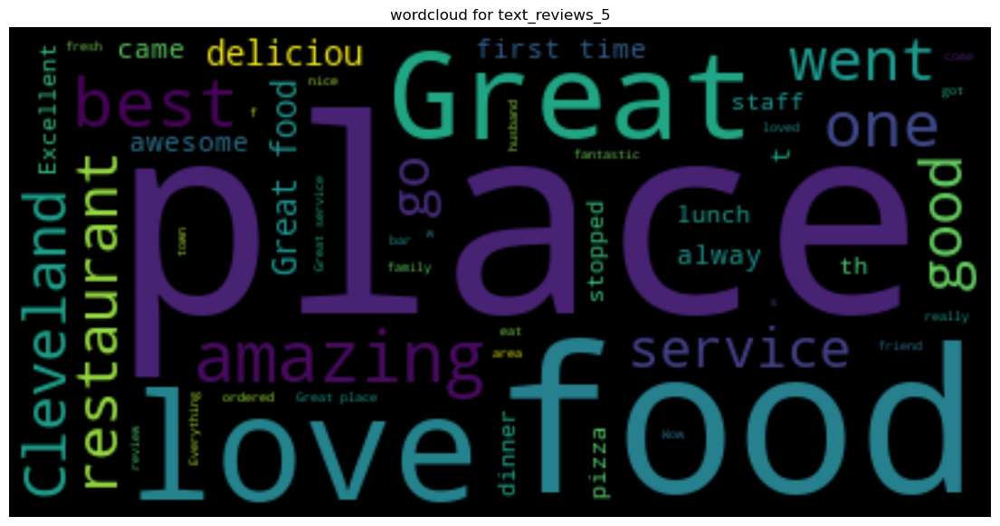

In [36]:
#wordcloud for text_reviews_5
wc = WordCloud(max_words=1000, stopwords=stopwords, margin=10,random_state=1).generate(text_reviews_5)
#visualising wordcloud for text_reviews_5
default_colors = wc.to_array()
plt.figure(figsize=(14,12))
plt.title("wordcloud for text_reviews_5")
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.show()

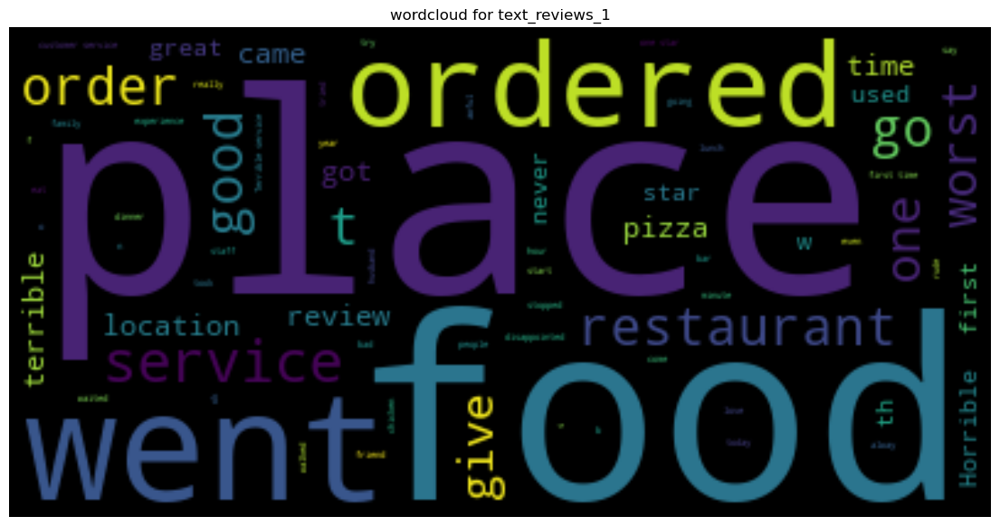

In [37]:
#wordcloud for text_reviews_1
wc = WordCloud(max_words=1000, stopwords=stopwords, margin=10,random_state=1).generate(text_reviews_1)
#visualising wordcloud for text_reviews_1
default_colors = wc.to_array()
plt.figure(figsize=(14,12))
plt.title("wordcloud for text_reviews_1")
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.show()

<div style="background-color:#3b528b;  color:white; padding:20px">
<h2> 8. Create n-grams for 5-star reviews</h2>
</div>

- Objectiveis to find  which words or phrases are the most common for 5-star reviews.
- Perform the steps and techniques to format the text and then count the frequency of either as one word, a bi-gram, a tri-gram, or a quad-gram.

<div style="background-color:#add8e6;  color:black; padding:20px">
<h3> 8(a).Create a counter for 5-star reviews
-  </h3>
</div>

- create a counter for 5-star reviews (one word)
- Using a Counter with no_stops_5, show the 30 most common words

In [38]:
# Importing nltk 
import nltk
nltk.download()
from collections import Counter

showing info https://raw.githubusercontent.com/nltk/nltk_data/gh-pages/index.xml


In [39]:
#importing stopwords from nltk.corpus
from nltk.corpus import stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/reshmarajan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [40]:
#Set a variable named cachedStopWords to the “english” stopwords dictionary and view it
cachedStopWords = set(stopwords.words("english"))
cachedStopWords

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 'her',
 'here',
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 'i',
 'if',
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'our',
 'ours',
 'ourselves',
 'out',
 'over',
 'own',
 'r

In [41]:
#Tokenize text_reviews_5 and name it tokens_5
tokens_5 = [w for w in nltk.word_tokenize(text_reviews_5.lower()) if w.isalpha()]

In [42]:
#Remove stop words with a function and name it no_stops_5
no_stops_5 = [t for t in tokens_5
if t not in cachedStopWords]

In [43]:
#showing the 30 most common words using a Counter with no_stops_5
Counter(no_stops_5).most_common(30)

[('place', 11839),
 ('great', 11837),
 ('food', 11408),
 ('best', 6432),
 ('love', 5943),
 ('service', 4478),
 ('good', 4287),
 ('amazing', 3770),
 ('time', 3305),
 ('restaurant', 3039),
 ('favorite', 3018),
 ('first', 2957),
 ('one', 2836),
 ('pizza', 2754),
 ('cleveland', 2427),
 ('delicious', 2421),
 ('went', 2387),
 ('excellent', 2242),
 ('always', 2197),
 ('awesome', 2020),
 ('go', 1881),
 ('really', 1841),
 ('lunch', 1730),
 ('came', 1642),
 ('staff', 1567),
 ('ever', 1493),
 ('stopped', 1444),
 ('atmosphere', 1427),
 ('friendly', 1393),
 ('dinner', 1370)]

In [44]:
#add between 5 and 10 words to exclude from the list. update the cachedStopWords use the .update(( )) feature.
cachedStopWords.update(('food','place','went','restaurant','go','came',))


In [45]:
#Rerun the function for no_stops_5
no_stops_5 = [t for t in tokens_5
if t not in cachedStopWords]

In [46]:
#show the 30 most common words in no_stops_5
Counter(no_stops_5).most_common(30)

[('great', 11837),
 ('best', 6432),
 ('love', 5943),
 ('service', 4478),
 ('good', 4287),
 ('amazing', 3770),
 ('time', 3305),
 ('favorite', 3018),
 ('first', 2957),
 ('one', 2836),
 ('pizza', 2754),
 ('cleveland', 2427),
 ('delicious', 2421),
 ('excellent', 2242),
 ('always', 2197),
 ('awesome', 2020),
 ('really', 1841),
 ('lunch', 1730),
 ('staff', 1567),
 ('ever', 1493),
 ('stopped', 1444),
 ('atmosphere', 1427),
 ('friendly', 1393),
 ('dinner', 1370),
 ('new', 1367),
 ('little', 1327),
 ('nice', 1292),
 ('fantastic', 1235),
 ('spot', 1226),
 ('experience', 1173)]

In [47]:
#Create a bigrams for no_stops_5 and view 30 common words
from nltk.util import ngrams
bigrams = ngrams(no_stops_5, 2)
Counter(bigrams).most_common(30)

[(('first', 'time'), 1755),
 (('great', 'service'), 1117),
 (('one', 'favorite'), 809),
 (('one', 'best'), 710),
 (('great', 'great'), 582),
 (('best', 'pizza'), 488),
 (('service', 'great'), 444),
 (('love', 'love'), 433),
 (('great', 'atmosphere'), 401),
 (('last', 'night'), 386),
 (('really', 'good'), 378),
 (('happy', 'hour'), 372),
 (('friendly', 'staff'), 347),
 (('hidden', 'gem'), 341),
 (('excellent', 'service'), 331),
 (('every', 'time'), 325),
 (('absolutely', 'love'), 312),
 (('favorite', 'places'), 302),
 (('hands', 'best'), 264),
 (('good', 'service'), 261),
 (('great', 'experience'), 259),
 (('new', 'favorite'), 254),
 (('always', 'great'), 250),
 (('first', 'visit'), 229),
 (('great', 'pizza'), 213),
 (('great', 'little'), 210),
 (('love', 'great'), 201),
 (('customer', 'service'), 201),
 (('amazing', 'service'), 196),
 (('several', 'times'), 190)]

<div style="background-color:#add8e6;  color:black; padding:20px">
<h3> 8(b)Create a counter using lemmatizing for 5-star reviews
-  </h3>
</div>

In [48]:
#Import WordNetLemmatizer and name it wordnet_lemmatizer.
from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

In [49]:
#Create a variable named lemmatized_5 that lemmatizes the words in no_stops_5.
lemmatized_5 = [wordnet_lemmatizer.lemmatize(t) for t in no_stops_5]

In [50]:
# counter for lemmatized_5 and name it text_bow_5
text_bow_5 = Counter(lemmatized_5)
text_bow_5.most_common(30)

[('great', 11841),
 ('best', 6432),
 ('love', 6011),
 ('service', 4491),
 ('time', 4426),
 ('good', 4313),
 ('amazing', 3770),
 ('favorite', 3102),
 ('first', 2957),
 ('pizza', 2865),
 ('one', 2849),
 ('cleveland', 2432),
 ('delicious', 2424),
 ('excellent', 2242),
 ('always', 2197),
 ('awesome', 2020),
 ('really', 1841),
 ('lunch', 1741),
 ('staff', 1571),
 ('ever', 1493),
 ('stopped', 1444),
 ('atmosphere', 1428),
 ('spot', 1399),
 ('dinner', 1397),
 ('friendly', 1393),
 ('new', 1367),
 ('little', 1327),
 ('nice', 1293),
 ('fantastic', 1235),
 ('experience', 1218)]

In [51]:
#DataFrame named text_chart_5 that includes the 30 most common words from text_bow_5
text_chart_5 = pd.DataFrame(text_bow_5.most_common(30), columns = ['word', 'freq'])
text_chart_5

,word,freq
0,great,11841
1,best,6432
2,love,6011
3,service,4491
4,time,4426
5,good,4313
6,amazing,3770
7,favorite,3102
8,first,2957
9,pizza,2865


In [52]:
#Create a bi-gram version using lemmatized_5 and name it bigrams_lem_5.
bigrams_lem_5 = ngrams(lemmatized_5, 2)
Counter(bigrams_lem_5).most_common(30)

[(('first', 'time'), 1756),
 (('great', 'service'), 1121),
 (('one', 'favorite'), 860),
 (('one', 'best'), 710),
 (('great', 'great'), 582),
 (('best', 'pizza'), 506),
 (('service', 'great'), 444),
 (('love', 'love'), 436),
 (('great', 'atmosphere'), 401),
 (('happy', 'hour'), 387),
 (('last', 'night'), 386),
 (('really', 'good'), 378),
 (('hidden', 'gem'), 355),
 (('friendly', 'staff'), 347),
 (('excellent', 'service'), 331),
 (('every', 'time'), 325),
 (('absolutely', 'love'), 315),
 (('favorite', 'place'), 304),
 (('great', 'experience'), 268),
 (('hand', 'best'), 264),
 (('good', 'service'), 263),
 (('new', 'favorite'), 260),
 (('always', 'great'), 250),
 (('first', 'visit'), 229),
 (('great', 'pizza'), 216),
 (('great', 'little'), 210),
 (('love', 'great'), 203),
 (('customer', 'service'), 201),
 (('amazing', 'service'), 198),
 (('great', 'price'), 197)]

In [53]:
#Create a tri-gram version using lemmatized_5 and name it trigrams_lem_5.
trigrams_lem_5 = ngrams(lemmatized_5, 3)
Counter(trigrams_lem_5).most_common(30)

[(('one', 'favorite', 'place'), 277),
 (('love', 'love', 'love'), 187),
 (('great', 'great', 'service'), 176),
 (('great', 'service', 'great'), 138),
 (('one', 'favorite', 'restaurant'), 128),
 (('ca', 'say', 'enough'), 86),
 (('best', 'pizza', 'cleveland'), 77),
 (('one', 'best', 'restaurant'), 71),
 (('say', 'enough', 'good'), 69),
 (('best', 'pizza', 'ever'), 68),
 (('great', 'customer', 'service'), 67),
 (('enough', 'good', 'thing'), 66),
 (('first', 'time', 'eating'), 65),
 (('one', 'best', 'place'), 65),
 (('first', 'time', 'today'), 65),
 (('first', 'time', 'trying'), 64),
 (('great', 'atmosphere', 'great'), 63),
 (('favorite', 'place', 'eat'), 62),
 (('today', 'first', 'time'), 59),
 (('best', 'corned', 'beef'), 56),
 (('every', 'time', 'come'), 54),
 (('dinner', 'last', 'night'), 52),
 (('one', 'favorite', 'spot'), 50),
 (('first', 'time', 'last'), 50),
 (('best', 'burger', 'ever'), 49),
 (('great', 'great', 'atmosphere'), 49),
 (('tried', 'first', 'time'), 48),
 (('never', 'b

In [54]:
#Create a quad-gram version using lemmatized_5 and name it quadgrams_lem_5.
quadgrams_lem_5 = ngrams(lemmatized_5, 4)
Counter(quadgrams_lem_5).most_common(30)

[(('say', 'enough', 'good', 'thing'), 63),
 (('one', 'favorite', 'place', 'eat'), 56),
 (('ca', 'say', 'enough', 'good'), 44),
 (('great', 'great', 'service', 'great'), 31),
 (('first', 'time', 'last', 'night'), 24),
 (('great', 'atmosphere', 'great', 'service'), 21),
 (('last', 'night', 'first', 'time'), 21),
 (('could', 'give', 'star', 'would'), 19),
 (('great', 'great', 'atmosphere', 'great'), 18),
 (('best', 'corned', 'beef', 'sandwich'), 17),
 (('one', 'favorite', 'restaurant', 'cleveland'), 17),
 (('great', 'service', 'great', 'great'), 16),
 (('great', 'service', 'great', 'atmosphere'), 15),
 (('new', 'york', 'style', 'pizza'), 14),
 (('one', 'favorite', 'place', 'cleveland'), 13),
 (('ca', 'say', 'enough', 'great'), 13),
 (('say', 'enough', 'great', 'thing'), 13),
 (('one', 'best', 'pizza', 'place'), 13),
 (('tried', 'first', 'time', 'today'), 12),
 (('one', 'best', 'meal', 'ever'), 12),
 (('one', 'best', 'place', 'eat'), 12),
 (('one', 'best', 'restaurant', 'cleveland'), 12),


<div style="background-color:#add8e6;  color:black; padding:20px">
<h3> 8(c) Explanation of results for 5-star reviews
-  </h3>
</div>

Analyzing the lemmatized results of restaurant reviews with a 5-star rating using different n-grams (unigram, bigram, trigram, and four-gram) reveals interesting patterns and highlights popular sentiments among customers:

**Unigrams** :
- Positive Adjectives: Words like 'great,' 'best,' 'amazing,' 'excellent,' 'awesome,' and 'fantastic' dominate, indicating a strong positive sentiment in these reviews.
- Emotional Connection: Words like 'love' and 'favorite' suggest a personal connection or loyalty to the restaurants.
- Service Quality: 'Service' is a key aspect of customer satisfaction, further emphasized in bigram and trigram results.


**Bigrams**:
- First Experiences: Phrases like 'first time' imply many customers are leaving reviews after their initial visit, which might be particularly memorable.
- Specific Praises: 'Great service,' 'friendly staff,' and 'excellent service' highlight specific aspects valued by customers.
- Repetitions for Emphasis: Phrases like 'great great' and 'love love' suggest a strong emphasis on these experiences.


 **Trigrams**:
- Favored Spots: 'One favorite place/restaurant' indicates a strong preference for certain locations.
- Experiences Over Time: 'Every time come' shows repeat visits, while 'first time trying/eating' points to new experiences.
- Specific Recommendations: References to 'best pizza in Cleveland' and 'best corned beef' indicate specific menu items that stand out.


 **Four-Grams** :
- Extended Praises: Phrases like 'say enough good thing' and 'could give star would' reflect highly positive experiences.
- Descriptive Experiences: 'Great atmosphere great service' and 'first time last night' provide a snapshot of the dining experience.
- Local Favorites: Mentions of 'Cleveland' and 'New York style pizza' hint at regional preferences or specialties.


**Interesting Observations**:
- Emphasis on Service and Atmosphere: Across all n-grams, there's a strong focus on the quality of service and the overall atmosphere of the restaurants.
- Repetition for Emphasis: The use of repetition in higher n-grams ('great great service great') is a unique way customers emphasize their positive experiences.
- Local and Specific References: Mentions of specific items or places (like 'Cleveland', 'New York style pizza') in higher n-grams provide insight into local preferences or famous dishes.


**Areas to Explore Further**:
- Regional Specialties: The frequent mentions of specific locations and dishes (e.g., 'best pizza in Cleveland') suggest a deeper exploration of regional tastes and specialties could be insightful.
- Impact of First Experiences: The emphasis on 'first time' experiences could be further explored to understand its impact on customer perceptions and long-term loyalty.

<div style="background-color:#3b528b;  color:white; padding:20px">
<h2> 9. Create n-grams for 1-star reviews</h2>
</div>

- Objectiveis to find  which words or phrases are the most common for 1-star reviews.
- Perform the steps and techniques to format the text and then count the frequency of either as one word, a bi-gram, a tri-gram, or a quad-gram.

<div style="background-color:#add8e6;  color:black; padding:20px">
<h3> 9(a).Create a counter for 1-star reviews
-  </h3>
</div>

- create a counter for 1-star reviews (one word)
- Using a Counter with no_stops_1, show the 30 most common words

In [55]:
#Tokenize text_reviews_1 and name it tokens_1
tokens_1 = [w for w in nltk.word_tokenize(text_reviews_1.lower()) if w.isalpha()]

In [56]:
#Remove stop words with a function and name it no_stops_1
no_stops_1 = [t for t in tokens_1
if t not in cachedStopWords]

In [57]:
#showing the 30 most common words using a Counter with no_stops_1
Counter(no_stops_1).most_common(30)

[('service', 2320),
 ('worst', 1644),
 ('ordered', 1294),
 ('ever', 1083),
 ('time', 1021),
 ('terrible', 949),
 ('horrible', 909),
 ('one', 882),
 ('good', 874),
 ('first', 799),
 ('would', 755),
 ('order', 748),
 ('give', 733),
 ('experience', 730),
 ('never', 664),
 ('pizza', 645),
 ('could', 623),
 ('like', 548),
 ('location', 534),
 ('got', 527),
 ('really', 512),
 ('last', 503),
 ('get', 493),
 ('bad', 489),
 ('great', 484),
 ('stars', 478),
 ('star', 460),
 ('night', 433),
 ('used', 429),
 ('rude', 421)]

In [58]:
#add between 5 and 10 words to exclude from the list. update the cachedStopWords use the .update(( )) feature.
cachedStopWords.update(('stars','stars','night','really','get','got'))


In [59]:
#Rerun the function for no_stops_1
no_stops_1 = [t for t in tokens_1
if t not in cachedStopWords]

In [60]:
#show the 30 most common words in no_stops_1
Counter(no_stops_1).most_common(30)

[('service', 2320),
 ('worst', 1644),
 ('ordered', 1294),
 ('ever', 1083),
 ('time', 1021),
 ('terrible', 949),
 ('horrible', 909),
 ('one', 882),
 ('good', 874),
 ('first', 799),
 ('would', 755),
 ('order', 748),
 ('give', 733),
 ('experience', 730),
 ('never', 664),
 ('pizza', 645),
 ('could', 623),
 ('like', 548),
 ('location', 534),
 ('last', 503),
 ('bad', 489),
 ('great', 484),
 ('star', 460),
 ('used', 429),
 ('rude', 421),
 ('waited', 416),
 ('disappointed', 414),
 ('customer', 406),
 ('review', 405),
 ('love', 402)]

In [61]:
#Create a bigrams for no_stops_1 and view 30 common words
from nltk.util import ngrams
bigrams = ngrams(no_stops_1, 2)
Counter(bigrams).most_common(30)

[(('first', 'time'), 336),
 (('could', 'give'), 315),
 (('customer', 'service'), 289),
 (('terrible', 'service'), 261),
 (('horrible', 'service'), 219),
 (('worst', 'service'), 218),
 (('one', 'star'), 213),
 (('service', 'ever'), 188),
 (('give', 'zero'), 173),
 (('worst', 'experience'), 153),
 (('one', 'worst'), 121),
 (('wish', 'could'), 105),
 (('drive', 'thru'), 104),
 (('would', 'give'), 99),
 (('waited', 'minutes'), 99),
 (('every', 'time'), 99),
 (('service', 'terrible'), 96),
 (('experience', 'ever'), 92),
 (('horrible', 'experience'), 85),
 (('zero', 'would'), 84),
 (('slow', 'service'), 84),
 (('bad', 'service'), 82),
 (('taco', 'bell'), 81),
 (('far', 'worst'), 81),
 (('worst', 'ever'), 80),
 (('start', 'saying'), 80),
 (('second', 'time'), 79),
 (('poor', 'service'), 79),
 (('let', 'start'), 76),
 (('last', 'time'), 75)]

<div style="background-color:#add8e6;  color:black; padding:20px">
<h3> 9(b)Create a counter using lemmatizing for 1-star reviews
-  </h3>
</div>

In [62]:
#Create a variable named lemmatized_1 that lemmatizes the words in no_stops_1.
lemmatized_1 = [wordnet_lemmatizer.lemmatize(t) for t in no_stops_1]

In [63]:
# counter for lemmatized_5 and name it text_bow_1
text_bow_1 = Counter(lemmatized_1)
text_bow_1.most_common(30)

[('service', 2328),
 ('worst', 1644),
 ('time', 1421),
 ('ordered', 1294),
 ('ever', 1083),
 ('terrible', 949),
 ('horrible', 909),
 ('one', 885),
 ('good', 877),
 ('order', 821),
 ('first', 799),
 ('experience', 797),
 ('would', 755),
 ('give', 738),
 ('pizza', 677),
 ('review', 669),
 ('never', 664),
 ('could', 623),
 ('location', 563),
 ('like', 560),
 ('last', 503),
 ('bad', 489),
 ('great', 484),
 ('star', 460),
 ('customer', 445),
 ('minute', 434),
 ('used', 429),
 ('rude', 421),
 ('waited', 416),
 ('disappointed', 414)]

In [64]:
#DataFrame named text_chart_1 that includes the 30 most common words from text_bow_1
text_chart_1 = pd.DataFrame(text_bow_1.most_common(30), columns = ['word', 'freq'])
text_chart_1

,word,freq
0,service,2328
1,worst,1644
2,time,1421
3,ordered,1294
4,ever,1083
5,terrible,949
6,horrible,909
7,one,885
8,good,877
9,order,821


In [65]:
# bi-gram version using lemmatized_1 and name it bigrams_lem_1.
bigrams_lem_1 = ngrams(lemmatized_1, 2)
Counter(bigrams_lem_1).most_common(30)

[(('first', 'time'), 336),
 (('could', 'give'), 315),
 (('customer', 'service'), 292),
 (('terrible', 'service'), 261),
 (('horrible', 'service'), 220),
 (('worst', 'service'), 218),
 (('one', 'star'), 213),
 (('service', 'ever'), 188),
 (('worst', 'experience'), 177),
 (('give', 'zero'), 174),
 (('one', 'worst'), 121),
 (('wish', 'could'), 105),
 (('experience', 'ever'), 105),
 (('drive', 'thru'), 104),
 (('waited', 'minute'), 101),
 (('would', 'give'), 99),
 (('every', 'time'), 99),
 (('service', 'terrible'), 96),
 (('horrible', 'experience'), 86),
 (('last', 'time'), 85),
 (('slow', 'service'), 85),
 (('zero', 'would'), 84),
 (('taco', 'bell'), 84),
 (('bad', 'service'), 82),
 (('far', 'worst'), 81),
 (('worst', 'ever'), 80),
 (('poor', 'service'), 80),
 (('start', 'saying'), 80),
 (('second', 'time'), 79),
 (('let', 'start'), 77)]

In [66]:
#Create a tri-gram version using lemmatized_1 and name it trigrams_lem_1.
trigrams_lem_1 = ngrams(lemmatized_1, 3)
Counter(trigrams_lem_1).most_common(30)

[(('worst', 'service', 'ever'), 118),
 (('could', 'give', 'zero'), 106),
 (('worst', 'experience', 'ever'), 76),
 (('wish', 'could', 'give'), 74),
 (('give', 'zero', 'would'), 71),
 (('worst', 'customer', 'service'), 66),
 (('could', 'give', 'would'), 62),
 (('horrible', 'customer', 'service'), 56),
 (('let', 'start', 'saying'), 49),
 (('worst', 'chipotle', 'ever'), 45),
 (('terrible', 'customer', 'service'), 38),
 (('would', 'give', 'zero'), 38),
 (('could', 'give', 'negative'), 36),
 (('worst', 'dining', 'experience'), 33),
 (('customer', 'service', 'ever'), 30),
 (('first', 'last', 'time'), 26),
 (('poor', 'customer', 'service'), 26),
 (('give', 'one', 'star'), 26),
 (('one', 'worst', 'experience'), 25),
 (('give', 'zero', 'could'), 25),
 (('worst', 'chinese', 'ever'), 22),
 (('worst', 'pizza', 'ever'), 22),
 (('worst', 'taco', 'bell'), 21),
 (('giving', 'one', 'star'), 19),
 (('could', 'give', 'star'), 18),
 (('worst', 'mcdonald', 'ever'), 17),
 (('placed', 'online', 'order'), 17),

In [67]:
#Create a quad-gram version using lemmatized_1 and name it quadgrams_lem_1.
quadgrams_lem_1 = ngrams(lemmatized_1, 4)
Counter(quadgrams_lem_1).most_common(30)

[(('could', 'give', 'zero', 'would'), 67),
 (('worst', 'customer', 'service', 'ever'), 29),
 (('wish', 'could', 'give', 'zero'), 22),
 (('would', 'give', 'zero', 'could'), 20),
 (('wish', 'could', 'give', 'negative'), 12),
 (('worst', 'service', 'ever', 'experienced'), 12),
 (('one', 'worst', 'dining', 'experience'), 11),
 (('could', 'give', 'star', 'would'), 11),
 (('one', 'worst', 'experience', 'ever'), 10),
 (('even', 'give', 'one', 'star'), 10),
 (('could', 'give', 'zero', 'star'), 10),
 (('give', 'le', 'one', 'star'), 9),
 (('worst', 'taco', 'bell', 'ever'), 9),
 (('worst', 'burger', 'king', 'ever'), 8),
 (('worst', 'dining', 'experience', 'ever'), 8),
 (('worst', 'service', 'ever', 'waited'), 7),
 (('would', 'even', 'give', 'one'), 7),
 (('could', 'give', 'le', 'one'), 7),
 (('never', 'get', 'order', 'right'), 6),
 (('one', 'worst', 'meal', 'ever'), 6),
 (('worst', 'dining', 'experience', 'life'), 6),
 (('wish', 'could', 'give', 'le'), 6),
 (('could', 'give', 'negative', 'star'),

<div style="background-color:#add8e6;  color:black; padding:20px">
<h3> 9(c) Explain the results for the n-grams for 1-star reviews
-  </h3>
</div>

- Analyzing the n-gram results from 1-star restaurant reviews reveals a stark contrast to the 5-star reviews, emphasizing dissatisfaction and specific issues customers faced:

**Unigrams**:
- Negative Sentiments: Words like 'worst,' 'terrible,' 'horrible,' and 'bad' dominate, indicating strong negative feelings.
- Focus on Service: 'Service' is the most mentioned aspect, suggesting it is a crucial factor in poor reviews.
- Mentions of 'Time' and 'Ordered': Frequent use of 'time' and 'ordered' may indicate issues with waiting times or order accuracy.


**Bigrams**:
- Service Quality: Phrases like 'terrible service,' 'horrible service,' and 'worst service' suggest that service quality is a major issue in negative experiences.
- First Impressions: 'First time' appears here as well, possibly indicating disappointing first visits.
- Extreme Feedback: 'Could give' and 'give zero' show customers' wishes to express extreme dissatisfaction.


**Trigrams**:
Emphasizing the Negative: Phrases like 'worst service ever,' 'could give zero,' and 'worst experience ever' emphasize the severity of the negative experiences.
Customer Service Issues: References to 'customer service' in a negative context are prominent, highlighting its importance in overall satisfaction.


**Four-Grams** :
- Desire for Lower Ratings: 'Could give zero would' and 'wish could give zero' indicate a desire for a rating even lower than 1-star, emphasizing extreme dissatisfaction.
- Specific Negative Experiences: 'Worst dining experience ever' and 'worst customer service ever' show specific areas where the restaurants failed to meet expectations.


**Interesting Observations**:
- Service as a Key Factor: Both in positive and negative reviews, 'service' is a recurring theme, underlining its importance in the dining experience.
- Contrasting Sentiments: The stark difference in language between 1-star and 5-star reviews (e.g., 'worst' vs. 'best', 'terrible' vs. 'great') vividly illustrates the polarized nature of customer experiences.
- Use of Extremes: 1-star reviews frequently employ language that indicates extreme dissatisfaction, suggesting that these reviews are often left by customers who had particularly negative experiences.


**Areas to Explore Further**:
- Service Quality Impact: The consistent mention of 'service' in negative contexts would be worth exploring to understand specific service aspects that lead to poor reviews.
- First-Time Experiences: Given the appearance of 'first time' in both positive and negative reviews, it would be interesting to investigate how first impressions impact long-term customer perceptions and loyalty.

<div style="background-color:#3b528b;  color:white; padding:20px">
<h2> 10. Project Summary: NLP Analysis of Restaurant Reviews in Ohio Using Yelp Dataset</h2>
</div>

**Project Context and Objectives**
- As a continuation of the restaurant recommender systems project, this phase focused on delving into the nuances of restaurant reviews in Ohio. Utilizing the same Yelp dataset, the goal was to employ Natural Language Processing (NLP) techniques to analyze and understand what users are saying about restaurants, particularly differentiating between 1-star and 5-star reviews.

**Methodologies**


1. Data Collection and Management:

- Efficient import and management of data from 'csv' files into structured formats suitable for analysis.
- Creation of new data frames specifically for restaurants with 1-star and 5-star reviews to facilitate focused analysis.

2. Natural Language Processing (NLP):

- Applied NLP techniques to process textual data from restaurant reviews. This included tokenization, stop-word removal, and lemmatization to prepare the data for detailed analysis.

3. Data Analysis and Visualization:

- Employed various data analysis techniques to extract meaningful insights from the reviews.
- Created visual representations like word clouds and n-gram analyses to illustrate findings.

**Key Findings**

1. 1-Star Reviews Analysis:

- Dominance of negative sentiments: Words like 'worst', 'terrible', 'horrible', and 'bad' were prevalent.
- Service Focus: A recurring emphasis on 'service' quality, indicating its significant impact on negative reviews.
- Time and Order Issues: Frequent mentions of 'time' and 'ordered', pointing to problems with waiting times and order accuracy.
- Extremes in Feedback: Use of phrases like 'terrible service', 'give zero' showing extreme dissatisfaction.

2. 5-Star Reviews Analysis:

- Positive Adjectives: Words such as 'great', 'best', 'amazing', highlighting strong positive sentiments.
- Emotional Connection: Terms like 'love' and 'favorite' indicating personal affinity towards the restaurants.
- Service Quality: Similar to 1-star reviews, 'service' was a key aspect but in a positive light.
- Specific Praises: 'Great service', 'friendly staff', and emphasis on first experiences.

**Interesting Observations**:

- Service as a Central Theme: Both positive and negative reviews heavily focused on the aspect of service.
- Contrasting Language Use: Stark differences in language used in 1-star vs. 5-star reviews, illustrating polarized customer experiences.
- Local and Specific References: Mentions of specific locations and dishes in higher n-grams hinting at regional favorites.

**Areas for Future Exploration**
- Impact of Service Quality: Further investigation into the specific elements of service that lead to positive or negative reviews.
- First-Time Experiences: Analysis of how initial experiences at a restaurant influence long-term customer perceptions and loyalty.
- Regional Specialties: Deeper exploration of local preferences and specialty dishes as indicated by specific mentions in reviews.

**Conclusion**
- This project successfully utilized NLP techniques to extract and analyze sentiments and patterns from restaurant reviews. The insights garnered, especially the emphasis on service quality and the distinct language used in different rating contexts, provide valuable inputs for restaurant owners and managers to improve customer experience. The use of data visualization tools like word clouds enhanced the interpretability of these insights, making the findings accessible and actionable.

<div style="background-color:#3b528b;  color:white; padding:20px">
<h2> 11. Reflection on the Data Project Experience</h2>
</div>

Working on this data project was an enriching and challenging experience. Handling the vast and complex Yelp dataset improved my skills in data management and preprocessing. Implementing advanced techniques like NLP, PCA, and SVD was both challenging and rewarding, offering deep insights into customer sentiments and behavior. Creating visual representations like word clouds and n-gram analyses was particularly satisfying, as it brought the data to life and made the insights accessible. This project not only honed my technical skills but also enhanced my problem-solving and project management abilities. The experience highlighted the importance of continuous learning and adaptability in the field of data science. Overall, it was a valuable journey that underscored the transformative power of data analytics in deriving meaningful business insights.





